# Predicting Dry-bean Variety Types Using Classification Algorithms

### The Problem 
Dry beans are an important food crop that is grown around the world. [In 2016](https://en.wikipedia.org/wiki/Phaseolus_vulgaris), more than 27 million tonnes of dry beans were harvested globally. Our project tackles a classification problem relating to dry beans varieties grown in Turkey.  

According to the authors of a [2020 study](https://www.sciencedirect.com/science/article/abs/pii/S0168169919311573?via%3Dihub), only a small percentage of the beans cultivated in Turkey come from certified seed that only contains one variaty of seed. Most of the bean cultivation has some level of diversity to it, and the beans need to be sorted after harvest to allow farmers to get the best prices for their products. Much like bringing a load of unsorted metal to a scrap yard, and mixed harvest of bean varieties gets devalued and discounted. Because the sorting process is tideous and labor intensive, effort is being made to explore ways that computers can assist in the bean sorting process.  

For our project, we use a dataset that contains computer collected measurements of 7 different types of Turkish dry beans. Our goal is to attempt to successfully classify the dry bean variety of individual beans by using their measured physical characteristics as the predictive variables. 

### The Data
[Our dataset](https://archive.ics.uci.edu/dataset/602/dry+bean+dataset) contains information from 13,000+ individual drybeans. The target variable is been variety, of which there are 7: Barbunya, Battal, Bombay, Calı, Dermason, Horoz, Tombul, Selanik and Seker. The dataset contains 16 feature columns, which are physical measurements of the beans obtained through computer vision measurement. Specifically the features available are:
| Variable Name        | Type           | Description  |
| ------------- |:-------------:| -----|
| Area      | Integer | The area of a bean zone and the number of pixels within its boundaries |
| Perimeter      | Continuous | Bean circumference is defined as the length of its border |
| MajorAxisLength      | Continuous | The distance between the ends of the longest line that can be drawn from a bean |
| MinorAxisLength      | Continuous | The longest line that can be drawn from the bean while standing perpendicular to the main axis |
| AspectRatio      | Continuous | Defines the relationship between MajorAxisLength and MinorAxisLength |
| Eccentricity      | Continuous | Eccentricity of the ellipse having the same moments as the region |
| ConvexArea      | Integer | Number of pixels in the smallest convex polygon that can contain the area of a bean seed |
| EquivDiameter      | Equivalent diameter: The diameter of a circle having the same area as a bean seed area |
| Extent      | Continuous | The ratio of the pixels in the bounding box to the bean area |
| Solidity      | Continuous | Also known as convexity. The ratio of the pixels in the convex shell to those found in beans. |
| Roundness      | Continuous | Calculated with the following formula: (4piA)/(P^2) |
| Compactness      | Continuous | Measures the roundness of an objec |
| ShapeFactor1      | Continuous |  |
| ShapeFactor2      | Continuous |  |
| ShapeFactor3      | Continuous |  |
| ShapeFactor4      | Continuous |  |


### Our Approach
Our machine learning task is a multi-class classification problem, and we have a clean, numeric dataset. We have decided to use two of the most effective classification models for this classification problem: Support Vector Machines (SVM) and Random Forests. For both models types, we will test the predictive accuracy using a baseline classifier with default values. We will then explore different hyperparameter and feature options to see if predictive power can be improved. Finally we will select the best models and evaluate them against a test set. 

Before proceeding with that, we will take a moment to explore our data. 


---
## Exploratory Data Analysis

In [2]:
import numpy as np
from matplotlib import pylab as plt
import pandas as pd
np.set_printoptions(precision=4)

# Runs the util notebook so that those functions are available
%run utils.ipynb

# Load our dataset
X,y, features = load_beans()

First thing that we will do is just take look at the histograms of each of our feature variables. 

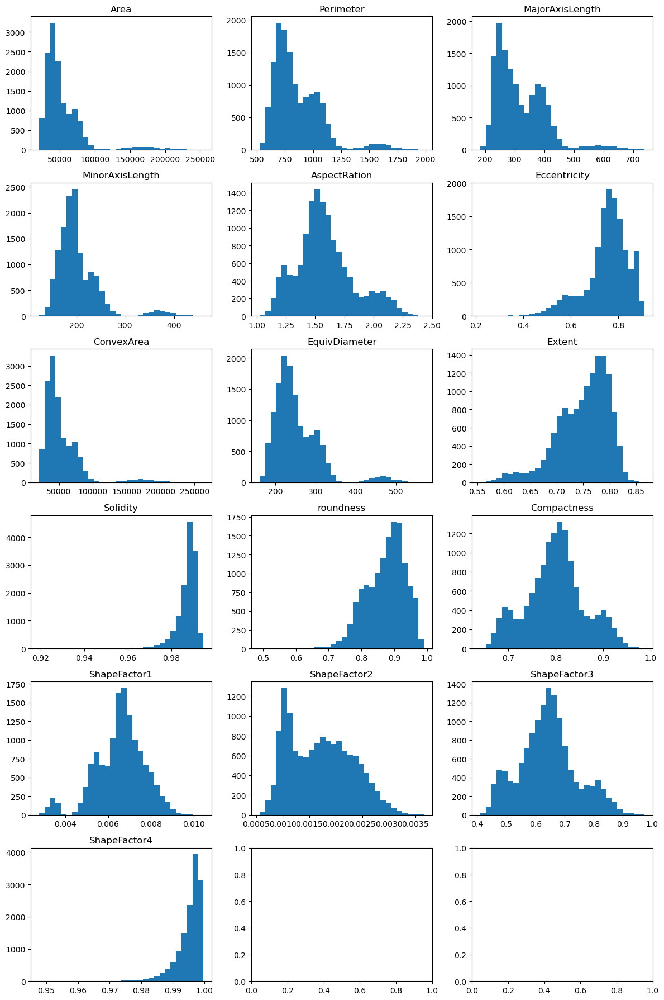

In [3]:
# Make a histogram of each variable
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(12, 18))
feat = 0

for i in range(6):
    for j in range(3):
            if (feat < len(features)):
                ax[i, j].hist(X[:, feat], bins = 30)
                ax[i, j].set_title(features[feat])
                feat += 1

plt.tight_layout()
plt.show()

While we can see that the feature variables have different distributions, probably the biggest thing we notice is that the variables have pretty different scales, and it will likely be advantageous for us to standardize the data. This is reinforced by seeing the ranges in the summary statistics of the dataset or by looking at the boxplots of the individual features:

In [4]:
#print out summary statistics
beans = pd.read_csv('https://raw.githubusercontent.com/oroconnor/CS345-Project/main/dry%2Bbean%2Bdataset/DryBeanDataset/Dry_Bean_Dataset.csv', delimiter=',')
beans.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


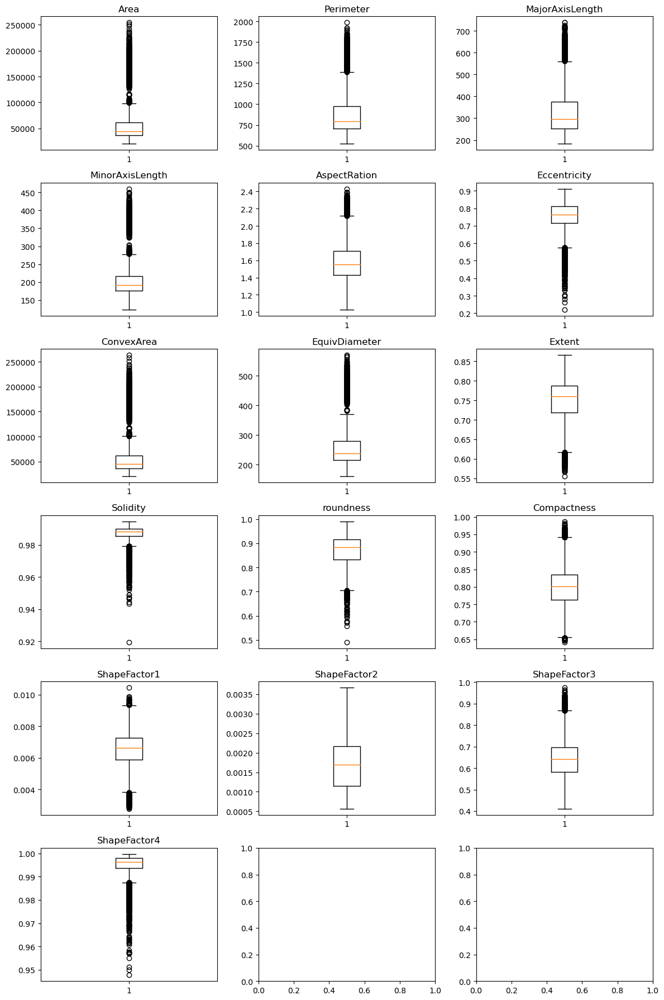

In [5]:
# Make a boxplot of each variable - ranges are too different to show all together
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(12, 18))
feat = 0

for i in range(6):
    for j in range(3):
            if (feat < len(features)):
                ax[i, j].boxplot(X[:, feat])
                ax[i, j].set_title(features[feat])
                feat += 1

plt.tight_layout()
plt.show()

Next we will take a look at some scatter plots of the data, with the target variable labelled by color. We are trying to get an appreciation of how seperated the data is in regards to the target variable. With 16 features, this is a lot of pairs to look at, but it still seems worth exploring:

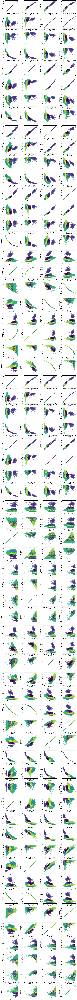

In [6]:
# Scatterplots, colored by target classifications
from sklearn.preprocessing import LabelEncoder
ynums = LabelEncoder().fit_transform(y)

nrows = 64
ncols = 4
fig, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize=(15, 3 * nrows))
i = 0
j = 0 
for feat1 in range (len(features)):
    for feat2 in range (len(features)):
            if ((feat2 < len(features)) and (feat1 < len(features))):
                #print("ax i : " , i)
                #print("ax j: " , j)
                ax[i, j].scatter(X[:, feat1], X[:, feat2], c=ynums, alpha=0.5, s=30)
                ax[i, j].set_xlabel(features[feat1])
                ax[i, j].set_ylabel(features[feat2])
                j += 1
                if j == 4:
                    j = 0
                    i += 1

plt.tight_layout()
plt.show()

There is defintely some seperation based on the target variable. However, there is still a lot of overlap. Hopefully by using all or most of the features we will be able to create enough distinction to succesfully predict the taget variable. It's also of note that some of the variable pairs have clear relationships with eachother that are likely a result of how they are calculated, such as "Aspect Ratio" and "Eccentricity". Considering the models that we are using and the fact that we want to include the other features as well, we don't think we need to explore those relationships any deeper.

Finally, we want to verify whether the data contains missing values, and see what the distribution is of the target variable in the dataset:

In [7]:
# Checking for missing values
beans.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

Looks like our dataset does not contain any missing values, so nothing to worry about there. 

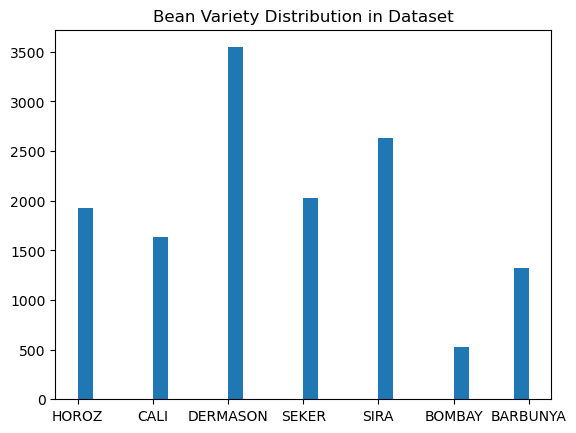

In [8]:
# Histogram of the target variable
plt.hist(y, bins = 30)
plt.title('Bean Variety Distribution in Dataset')
plt.show()

It's good that we checked, as the dataset is imbalanced in regards to the target classifications! We will be sure to use Stratified Kfolds as a standard practice when evaluating our classification accuracy. 

---
## Support Vector Machines 

#### Split the data

In [9]:
from sklearn.model_selection import train_test_split
from sklearn import svm

# data shuffled while loading in
X, y, features = load_standardized_beans()

# holding out a test set for final evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= .2) 

#### Baseline SVM

In [10]:
# Doing a baseline SVM, with the default parameters. Default C is 1.0
classifier = svm.SVC(kernel="linear")

""""
# But because the target variable is unbalnced, we will use Stratified K folds, to makes sure we have a good 
sense of the baseline. 
We've put this into a function to make sure that we test these classifiers in a consistent manner. 
"""
test_classifier(classifier, X_train, y_train)

Classifier type: SVC
Classifier paramaters:  {'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Classifier accuracy:  0.92689183563197


Scikit Learn's documentation says that the One Versus One option for the decision_function_shape argument is deprecated, and that One Versus Rest is both recommended and the default. Doesn't seem to change the results at all, so moving forward we will leave it with the default that the package recommends, the One Versus Rest.

In [11]:
classifier = svm.SVC(kernel="linear", decision_function_shape='ovo')
test_classifier(classifier, X_train, y_train)

Classifier type: SVC
Classifier paramaters:  {'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovo', 'degree': 3, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Classifier accuracy:  0.92689183563197


Just to verify our assumption, before we proceed forward, that the standardized data provides a benifit over the raw data:

In [12]:
# Trying SVM classification with the non-standardized data
X, y, features = load_beans()
X_train_standard, X_test_standard, y_train_standard, y_test_standard = train_test_split(X, y, test_size= .2) 
classifier = svm.SVC(kernel="linear")
test_classifier(classifier, X_train_standard, y_train_standard)

Classifier type: SVC
Classifier paramaters:  {'C': 1.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'linear', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Classifier accuracy:  0.9139423212793572


The standardized dataset seems to have a small accuracy advantage over the raw data. However, there is a big improvement with computation time. We will leave the raw data behind now, and only work with the standardized data. We have already split the standardized data into X_train, X_test, y_train, y_test, so we will work with those training sets for our SVM and Random Forests model exploration, and hold out the test set until final model evaluation.

#### Searching through hyperparameter options

Now that we have established a baseline model accuracy of **92.6%** using a linear SVM model with scikit learn's defaults and a standardized dataset, we will proceed to tuning our hyperparameters and seeing if we can find a better model for predicting the dry bean varieties. 

##### Grid Search:

In [13]:
# We broke up grid search by kernel types, as it was taking too long when combined.
from sklearn.model_selection import GridSearchCV
gammas = np.logspace(-6, 3, num=10, endpoint=True, base=10.0)
Cs = np.logspace(-6, 3, num=10, endpoint=True, base=10.0)
param_grid = [
  {'C': Cs,
   'kernel': ['linear']}
 ]

gridclassifier = GridSearchCV(svm.SVC(), param_grid, cv=stratcv )
gridclassifier.fit(X_train, y_train)

results = pd.DataFrame({
    'Parameters': gridclassifier.cv_results_['params'],
    'Mean Accuracy': gridclassifier.cv_results_['mean_test_score'],
    'Std Dev Accuracy': gridclassifier.cv_results_['std_test_score']
    })

results_linear = results.sort_values(by='Mean Accuracy', ascending=False)
results_linear.to_csv('gridsearch_results_linear.csv')


In [14]:
# Now with the Gaussian kernel
gammas = np.logspace(-6, 3, num=10, endpoint=True, base=10.0)
Cs = np.logspace(-6, 3, num=10, endpoint=True, base=10.0)
param_grid = [
  {'C': Cs,
   'gamma': gammas,
   'kernel': ['rbf']}
 ]

gridclassifier = GridSearchCV(svm.SVC(), param_grid, cv=stratcv )
gridclassifier.fit(X_train, y_train)

results = pd.DataFrame({
    'Parameters': gridclassifier.cv_results_['params'],
    'Mean Accuracy': gridclassifier.cv_results_['mean_test_score'],
    'Std Dev Accuracy': gridclassifier.cv_results_['std_test_score']
    })

results_rbf = results.sort_values(by='Mean Accuracy', ascending=False)
results_rbf.to_csv('gridsearch_results_rbf.csv')

In [15]:
results_combined = pd.concat([results_linear, results_rbf], ignore_index=True)
results_combined = results_combined.sort_values(by='Mean Accuracy', ascending=False)

print("Out of the options considered, the best SVM model is: \n", results_combined.iloc[0])

Out of the options considered, the best SVM model is: 
 Parameters          {'C': 1000.0, 'gamma': 0.001, 'kernel': 'rbf'}
Mean Accuracy                                               0.9313
Std Dev Accuracy                                           0.00476
Name: 10, dtype: object


In [16]:
# Just verifying that we can reproduce the results
classifier = svm.SVC(kernel = "rbf", C = 10.0, gamma = 0.1)
test_classifier(classifier, X_train, y_train)

Classifier type: SVC
Classifier paramaters:  {'C': 10.0, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.1, 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Classifier accuracy:  0.931300392744415


#### Feature selection

In [17]:
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE

selector = RFE(svm.SVC(kernel='linear'), step=1, 
               n_features_to_select=10)

pipeline = Pipeline(
    [('feature_selector', selector),
     ('classifier', svm.SVC(kernel='rbf'))])

feature_search = GridSearchCV(pipeline, 
                          {'feature_selector__n_features_to_select' : 
                           np.arange(1, 17)}, cv=stratcv,)

In [18]:
feature_search.fit(X_train, y_train)
print(feature_search.best_params_)
#trying to find which feature was eliminated in the best option:
print(feature_search.best_estimator_['feature_selector'].support_ )


{'feature_selector__n_features_to_select': 16}
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


In [19]:
feature_results = feature_search.cv_results_

print("Accuracy for Different Numbers of Features:")
for i in range(16):
    print(feature_results['params'][i], " : " , feature_results['mean_test_score'][i])

Accuracy for Different Numbers of Features:
{'feature_selector__n_features_to_select': 1}  :  0.6405213027253367
{'feature_selector__n_features_to_select': 2}  :  0.8720644875278023
{'feature_selector__n_features_to_select': 3}  :  0.9065008459337603
{'feature_selector__n_features_to_select': 4}  :  0.9060417091109871
{'feature_selector__n_features_to_select': 5}  :  0.906225574743552
{'feature_selector__n_features_to_select': 6}  :  0.9145836786877417
{'feature_selector__n_features_to_select': 7}  :  0.9211061211353524
{'feature_selector__n_features_to_select': 8}  :  0.9213815610483251
{'feature_selector__n_features_to_select': 9}  :  0.920646899951197
{'feature_selector__n_features_to_select': 10}  :  0.9201876787670414
{'feature_selector__n_features_to_select': 11}  :  0.9224837425071275
{'feature_selector__n_features_to_select': 12}  :  0.9253305595310858
{'feature_selector__n_features_to_select': 13}  :  0.9277181553708885
{'feature_selector__n_features_to_select': 14}  :  0.9288

It looks like the accuracy doesn't get any better when features are eliminated. While this search is not trying out all of the possibilities for other parameters, it is indicating that as additional features get included, the accuracy improves, and the best accuracy is found when all 16 features are present. So we will proceed with the full set of features.

#### Best SVM model found

####

---
## Random Forests

#### Split the Data

In [ ]:
X, y, features = load_standardized_beans()
X_train, X_valid, X_test, y_train, y_valid, y_test =  split(X,y)

#### Baseline Random Forests

In [ ]:
# Baseline RandomForests Classifier
#using n_estimators as 100
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=100)

classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_valid)
print('accuracy: ', np.mean(y_valid == y_pred))

accuracy:  0.9114946749908189


Show accuracy difference between standardized and regular dataset:

In [ ]:
test_classifier(classifier, X, y)

Classifier type: RandomForestClassifier
Classifier paramaters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Classifier accuracy:  0.9230770455393588


In [ ]:
# Trying SVM classification with the non-standardized data

X, y, features = load_beans()

classifier = RandomForestClassifier(n_estimators=100)
test_classifier(classifier, X, y)

Classifier type: RandomForestClassifier
Classifier paramaters:  {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Classifier accuracy:  0.9227829820968843


In this case, the standardized data has a slightly higher accuracy, if we are looking at 3 significant figures or more. Just as was done with the SVM, we will be sticking with standardized Data for the time being.

In [ ]:
X, y, features = load_standardized_beans()

The Baseline accuracy at the moment is **92.3%** using the Random Forests Classifier. At this point, the hyperparameters will be tuned, in order to find the best model for our data.

#### Searching through hyperparameter options

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [10, 20, 30]
}

grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Hyperparameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

Best Hyperparameters: {'max_depth': 20, 'n_estimators': 200}
Best Accuracy: 0.919911829537105


As you can see above, the best value for the maximum depth was 20, with an n_estimator value of 200. I would like to note that it was not feasible to do more than three values in the parameter grid, nor to add additional parameters such as the minimum samples split value, or the minumum samples leaf value, as doing so would increase the computation time to over an hour.

#### Feature selection

The code below will help us determine what are considered the most impactful features from the dataset

In [ ]:
import pandas as pd


classifier.fit(X_train, y_train)
importances = classifier.feature_importances_

importance_df = pd.DataFrame({'Feature': features, 'Importance': importances})

print(importance_df)

            Feature  Importance
0              Area    0.067300
1         Perimeter    0.094562
2   MajorAxisLength    0.075821
3   MinorAxisLength    0.082326
4      AspectRation    0.052223
5      Eccentricity    0.068335
6        ConvexArea    0.060110
7     EquivDiameter    0.062373
8            Extent    0.010518
9          Solidity    0.017279
10        roundness    0.051637
11      Compactness    0.100038
12     ShapeFactor1    0.088968
13     ShapeFactor2    0.046890
14     ShapeFactor3    0.088334
15     ShapeFactor4    0.033287



Display the importance of the features in the dataset:

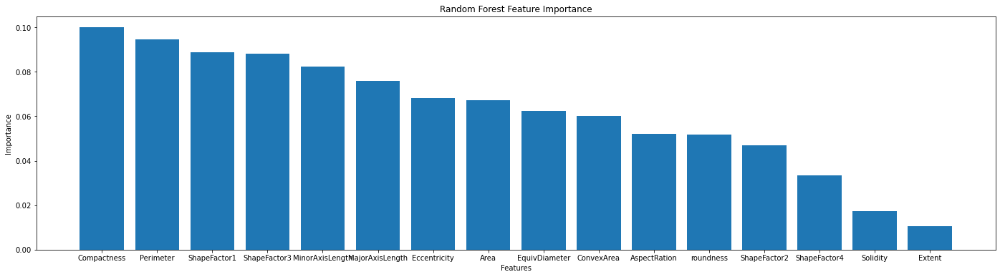

In [ ]:
import matplotlib.pyplot as plt

importance_df = importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(24, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Random Forest Feature Importance')
plt.show()

As can be seen in the graph above, the feature with the highest importance is identified to be the Perimiter, while the Extent and Solidity Features of the drybeans dataset, have been slated as the least impactful. The next segment of code will show how the accuracy may change when the two lowest impact features are removed.

Accuracy with the two lowest importance features removed:

In [ ]:
import numpy as np

X = np.delete(X, 8, axis = 1)
X = np.delete(X, 8, axis = 1)
features.pop(8)
features.pop(8)

'Solidity'

In [ ]:
classifier = RandomForestClassifier(n_estimators=100)

classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_valid)
print('accuracy: ', np.mean(y_valid == y_pred))

accuracy:  0.9103929489533603


Based on the accuracies gathered, of the standardized version, vs the version with the removal of the two features that were considered the least important, there is actually a decrease in the accuracy by roughly 1 percent. As such, its obvious that while the importance of those two features were not as high as the others, they do affect the overall acucracy, albeit slightly.

---
## Conclusions

#### Evaluating accuracy of the best SVM model against the test set

#### Evaluating accuracy of the best Random Forest model against the test set